In [1]:
import openbabel
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import ast
import seaborn as sns
import openbabel.pybel as pybel
import glob
import itertools
from IPython.display import SVG

# From scPDB to a training set

We will use scPDB dataset which contains on download, 17594 PDB directories. Some of them are repeated, probably because have more than 1 binding site (around 982, which I have stored in a list). From these we have therefore 16612 unique PDB identifiers. 

We map them to a UniprotID KD and we obtain 5643 UniProt IDs. These will serve us to first clusterize strucutres that refer to the same protein. This simplifies the later training even if we lose a bit of information about different binding modes that the protein can have. 

It will be important in the future to look at the complete clusters and check if there are different binding sites. We need to account them.

We will first then obtain these clusters and look at how many strucutres where in each one.

## Clustering according to UniProt ID

In [2]:
%%bash

! for i in ../db/scPDB/*; do echo ${i:12:4} >> PDB_list; done
! sort PDB_list | uniq  > PDB_list_cleansed
! sort PDB_list > PDB_list_sorted
! comm -23 PDB_list_sorted PDB_list_cleansed > PDB_repeated

CalledProcessError: Command 'b'\n! for i in ../db/scPDB/*; do echo ${i:12:4} >> PDB_list; done\n! sort PDB_list | uniq  > PDB_list_cleansed\n! sort PDB_list > PDB_list_sorted\n! comm -23 PDB_list_sorted PDB_list_cleansed > PDB_repeated\n'' returned non-zero exit status 1.

I have a script uniprot_maping.py that I use to retrieve the Uniprot IDs from Uniprot.

In [ ]:
%%bash 

! sed -e 's/;/\",\"/g; s/^\([^\"]*\)\",\"\(.*\),\"$/\1;\[\"\2\];/g' PDB_uniprot_maping_orig.csv > PDB_uniprot_maping.csv


Now we have a .csv with a nice disposition of the clusters.
(i had to do the previous sed command because I'm stupid and I generated a format with a lot of columns that would not be readable. I did not want to retrieve again all the UniProt codes so I just do a bit of formating in old reliable sed.

In [2]:
PDB_maping_df = pd.read_csv('PDB_uniprot_maping.csv', sep=';', names=['UniProtID', 'PDB_codes'], index_col=False)

In [3]:
PDB_maping_df

,UniProtID,PDB_codes
0,P05102,"[""10mh"",""1fjx"",""1mht"",""1skm"",""2c7q"",""2hmy"",""2i..."
1,P00669,"[""11bg""]"
2,P09211,"[""12gs"",""13gs"",""17gs"",""19gs"",""1aqv"",""1aqx"",""1g..."
3,P26446,"[""1a26"",""1efy"",""1pax""]"
4,P14061,"[""1a27"",""1dht"",""1equ"",""1fds"",""1fdt"",""1fdu"",""1f..."
...,...,...
5638,P23528,"[""5l6w""]"
5639,Q8JJ25,"[""5l8j"",""5l8k"",""5l8l""]"
5640,Q7YW97,"[""5lc1""]"
5641,P21554,"[""5tgz"",""5xr8"",""5xra""]"


We have 5643 UniProtID KD (clusters)

In [4]:
PDB_maping_df['PDB_codes'][0]

'["10mh","1fjx","1mht","1skm","2c7q","2hmy","2i9k","2uyh","2z6u","2zcj","3mht","4mht","5mht","7mht","8mht","9mht"]'

In [5]:
PDB_maping_df['PDB_codes'] =PDB_maping_df['PDB_codes'].apply(lambda x: ast.literal_eval(x))

In [6]:
type(PDB_maping_df['PDB_codes'][0])

list

In [7]:
PDB_maping_df['len'] = PDB_maping_df['PDB_codes'].apply(lambda x: len(x))

In [9]:
PDB_maping_df['len_int'] = pd.cut(PDB_maping_df['len'], bins=[0,1,2,3,5,7,10,20,99,300], labels=['1','2','3','4-5','6-7','8-10','11-20','21-99','100-300'])



<Axes: xlabel='len_int', ylabel='Count'>

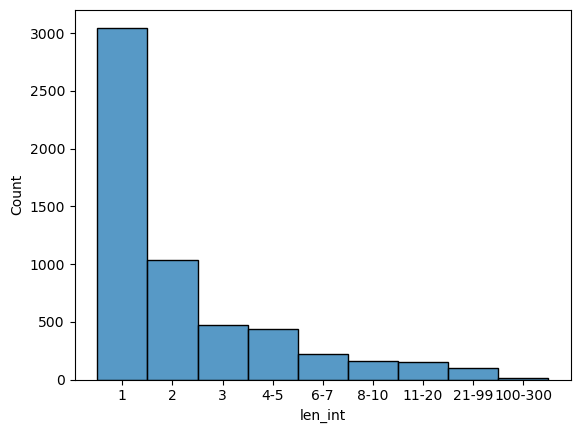

In [10]:
sns.histplot(PDB_maping_df['len_int'], stat='count')

So, the majority of clusters have just 1 protein. For the others, we will have to decide which one to use. We will calculate the tanimoto coefficient. Later, we will have to compare clusters betwen them, because 3000 strucutres is too much for our model.

In [8]:
subset_big_df = PDB_maping_df.loc[PDB_maping_df['len_int'] != '1']

KeyError: 'len_int'

In [12]:
subset_big_df

,UniProtID,PDB_codes,len,len_int
0,P05102,"[10mh, 1fjx, 1mht, 1skm, 2c7q, 2hmy, 2i9k, 2uy...",16,11-20
2,P09211,"[12gs, 13gs, 17gs, 19gs, 1aqv, 1aqx, 1gss, 1pg...",22,21-99
3,P26446,"[1a26, 1efy, 1pax]",3,3
4,P14061,"[1a27, 1dht, 1equ, 1fds, 1fdt, 1fdu, 1fdw, 1i5...",17,11-20
5,P62157,"[1a29, 1lin, 1qiv, 1qiw, 1xa5]",5,4-5
...,...,...,...,...
5618,Q9LBJ0,"[5jdz, 5je2, 5je3, 5je4]",4,4-5
5625,P59078,"[5k0s, 5k0t]",2,2
5629,Q97ML2,"[5kf1, 5kf2, 5kf8, 5kf9, 5kgh, 5kgj, 5kgp]",7,6-7
5639,Q8JJ25,"[5l8j, 5l8k, 5l8l]",3,3


## Calculating tanimoto coefficients

So, in the paper what they do is to take the entire protein and take with a sliding widnow each 3 residues, use them to compute their MACCS key and append it to a list. then, this entire array is what they compare between proteins taking the intersection and denominator to get the tanimoto coefficient.

I can try this but first let's see what happens if I just directly calculate the MACCS for the entire protein.

In [13]:
#example
'../db/scPDB/1a26_1/protein.mol2'

'../db/scPDB/1a26_1/protein.mol2'

In [14]:
prot1 = next(pybel.readfile('mol2', '../db/scPDB/1a26_1/protein.mol2'))

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a26_CNA_1_protein)



In [18]:
prot_fp = prot1.calcfp('MACCS')

In [19]:
maccs = list(prot_fp.bits)

In [20]:
len(maccs)

86

In [9]:
subset_test = PDB_maping_df.loc[PDB_maping_df['len'] == 4]

In [10]:
list_test = subset_test['PDB_codes'].iloc[1]

In [24]:
fp_dict = {}
for i in list_test:
    for folder in glob.glob('../db/scPDB/'+i+'*/'):
        protein = next(pybel.readfile('mol2', folder+'protein.mol2'))
        prot_fp = protein.calcfp('MACCS')
        if i in fp_dict:
            fp_dict[i].append(prot_fp)
        else:
            fp_dict[i] = [prot_fp]

        
    

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a9c_GTP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3s_GTP_9_protein)



In [25]:
fp_dict

{'1a8r': [<openbabel.pybel.Fingerprint at 0x7f2a4ffed650>],
 '1a9c': [<openbabel.pybel.Fingerprint at 0x7f2a4fe25310>],
 '1n3r': [<openbabel.pybel.Fingerprint at 0x7f2a4fef56d0>],
 '1n3s': [<openbabel.pybel.Fingerprint at 0x7f2a4fc1e290>]}

In [137]:
for i in itertools.combinations(fp_dict, 2):
    print(fp_dict[i[0]][0] | fp_dict[i[1]][0])

1.0
1.0
1.0
1.0
1.0
1.0


So, those are the Tanimoto coefficient for these PDBs. Now, just as a demonstration I will compare this with an unrelated protein

In [149]:
for folder in glob.glob('../db/scPDB/12gs*'):
    protein_2 = next(pybel.readfile('mol2', folder+'/protein.mol2'))
    protein_2_fp = protein_2.calcfp('MACCS')

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 12gs_0HH_1_protein)



In [150]:
fp_dict['1a8r'][0] | protein_2_fp

1.0

Therefore, we are seeing why we need to calculate several fingerprints for proteins, a string of 87 numbers is not enough to distinguish proteins.

First, I have to learn how to generate these "sliding windows" as a coherent molecules... not just their atoms but I need the entire residues and connected.

In [11]:
def get_sliding_windows(protein_path, file_type):
    mol = next(pybel.readfile(file_type, protein_path))
    residues = [x for x in openbabel.OBResidueIter(mol.OBMol)]
    for i in range(len(residues)-3):
        window = residues[i:i+3]
        window_res = openbabel.OBMol()
        for r in window:
            for atom in openbabel.OBResidueAtomIter(r):
                window_res.AddAtom(atom)
        window_res.ConnectTheDots()
        mol = pybel.Molecule(window_res)
        return mol
    

In [16]:
molec = get_sliding_windows('../db/scPDB/1a26_1/protein.mol2', 'mol2')

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a26_CNA_1_protein)



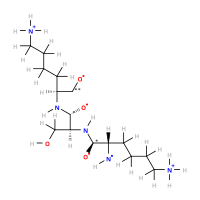

In [21]:
SVG(molec.write("svg"))

This looks decent. Now, we need to continue the development of this function to calculate really the fingerprints. In the paper of PureResNet they calculatye a 167-bits key. This means that we should calculate the MACCS fingerprint, obtain the bits and transform this into 1 or 0 in a list of 167 digits.

If the MACCS was: 22, 67, 45... then we will put a 1 in the 22, 67 and 45 digit and 0 in the others.

Then to calculate the tanimoto coefficient...

$T = N_{A&B} / N_{A} + N_{B} – N_{A&B}$

Where N_{A&B} is the features common (intersection)


In [12]:
def calculate_fingerprints(protein_path, file_type):
    fingerprint_l = []
    mol = next(pybel.readfile(file_type, protein_path))
    residues = [x for x in openbabel.OBResidueIter(mol.OBMol)]
    for i in range(len(residues)-3):
        window = residues[i:i+3]
        window_res = openbabel.OBMol()
        for r in window:
            for atom in openbabel.OBResidueAtomIter(r):
                window_res.AddAtom(atom)
        window_res.ConnectTheDots()
        mol = pybel.Molecule(window_res)
        maccs_key = list(mol.calcfp('MACCS').bits)
        fingerprint = [1 if bit in maccs_key else 0 for bit in range(167)]
        fingerprint_l.append(fingerprint)
        return fingerprint_l

In [13]:
def calculate_tanimoto_coef(fingerprint1, fingerprint2):
    fp1_a = np.asarray(fingerprint1)
    fp2_a = np.asarray(fingerprint2)
    intersect = np.sum(fp1_a*fp2_a)
    tanimoto = intersect / (np.sum(fp1_a)+np.sum(fp2_a)-intersect)
    return tanimoto

Now, in the paper they explain that in each cluster, they calculate the 167-bit array and:

if A1 = A2 -> Tanimoto is calculated.

A1 > A2 or A2 > A1: This should not happen... we are letting the array have a 167 length. but if it happens in the paper what they do is take the length of the shortest and create all possible arrays of the longest one, calculate all the tanimotos and take the maximum value.

In [16]:
def get_tanimoto(filetype1, file1, filetype2, file2):
    finger1 = calculate_fingerprints(file1, filetype1)
    finger2 = calculate_fingerprints(file2, filetype2)
    if len(finger1) == len(finger2):
        tanimoto = calculate_tanimoto_coef(finger1, finger2)
        return tanimoto
    else:
        #this shouldn't be happening
        print("MACCS have different length")
        l_1 = len(finger1)
        l_2 = len(finger2)
        if l_1 > l_2:
            tanimotos_l = []
            for i in range(l_1-l_2):
                tani = calculate_tanimoto_coef(finger1[i:i+l_2], finger2)
                tanimotos_l.append(tani)
            return np.max(tanimotos_l)
        else:
            tanimotos_l = []
            for i in range(l_2-l_1):
                tani = calculate_tanimoto_coef(finger1, finger2[i:i+l_1])
                tanimotos_l.append(tani)
            return np.max(tanimotos_l)


In [38]:
folder1 = glob.glob('../db/scPDB/1n3r*/')[0]
folder2 = glob.glob('../db/scPDB/2xhx*/')[0]
tanimoto = get_tanimoto('mol2', folder1+'protein.mol2', 
                                    'mol2', folder2+'protein.mol2')
tanimoto

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)



0.7

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xhx_T5M_1_protein)



(this was just to show what happens when we put two very dissimilar proteins... they get a lower coefficient). 
Believe me, they are pretty different

In [30]:
list_test

['1a8r', '1a9c', '1n3r', '1n3s']

In [34]:
tanimotos_l = []

for i,j in itertools.combinations(list_test, 2):
    temp_tan = []
    for folder1 in glob.glob('../db/scPDB/'+i+'*/'):
        for folder2 in glob.glob('../db/scPDB/'+j+'*/'):
            tanimoto = get_tanimoto('mol2', folder1+'protein.mol2', 
                                    'mol2', folder2+'protein.mol2')
            temp_tan.append(tanimoto)
    tanimotos_l.append((i, j, np.max(temp_tan)))

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a9c_GTP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3s_GTP_9_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a9c_GTP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)

*** Open Babel Warning  in ReadMolec

In [42]:
pd.DataFrame(tanimotos_l)

,0,1,2
0,1a8r,1a9c,1.0
1,1a8r,1n3r,1.0
2,1a8r,1n3s,1.0
3,1a9c,1n3r,1.0
4,1a9c,1n3s,1.0
5,1n3r,1n3s,1.0


Now, this applies to an entire cluster so we need to read the list of proteins in cluster X and do all possible combinations with get_tanimoto, calculating a matrix. 

From that matrix we will need to separate those proteins having values below 0.8 and check them.

If this does not happen we will later decide which protein to take.

In [15]:
def calculate_cluster(list_pdbs):
    tanimotos_l = []
    for i,j in itertools.combinations(list_pdbs, 2):
        temp_tan = []
        for folder1 in glob.glob('../db/scPDB/'+i+'*/'):
            for folder2 in glob.glob('../db/scPDB/'+j+'*/'):
                tanimoto = get_tanimoto('mol2', folder1+'protein.mol2', 
                                        'mol2', folder2+'protein.mol2')
                temp_tan.append(tanimoto)
        tanimotos_l.append((i, j, np.max(temp_tan)))
    return tanimotos_l

In [45]:
subset_big_df

,UniProtID,PDB_codes,len,len_int
0,P05102,"[10mh, 1fjx, 1mht, 1skm, 2c7q, 2hmy, 2i9k, 2uy...",16,11-20
2,P09211,"[12gs, 13gs, 17gs, 19gs, 1aqv, 1aqx, 1gss, 1pg...",22,21-99
3,P26446,"[1a26, 1efy, 1pax]",3,3
4,P14061,"[1a27, 1dht, 1equ, 1fds, 1fdt, 1fdu, 1fdw, 1i5...",17,11-20
5,P62157,"[1a29, 1lin, 1qiv, 1qiw, 1xa5]",5,4-5
...,...,...,...,...
5618,Q9LBJ0,"[5jdz, 5je2, 5je3, 5je4]",4,4-5
5625,P59078,"[5k0s, 5k0t]",2,2
5629,Q97ML2,"[5kf1, 5kf2, 5kf8, 5kf9, 5kgh, 5kgj, 5kgp]",7,6-7
5639,Q8JJ25,"[5l8j, 5l8k, 5l8l]",3,3


In [ ]:
cluster_to_evaluate = []
for cluster in subset_big_df.iterrows():
    if cluster[1][2] == 1:
        continue
    cluster_name = cluster[1][0]
    cluster_l = cluster[1][1]
    tanimotos_l = calculate_cluster(cluster_l)
    tanimotos_a = np.array([x[2] for x in tanimotos_l])
    ev = ((tanimotos_a <= 0.8).sum() == tanimotos_a.size).astype(int)
    if ev != 1:
        cluster_to_evaluate.append((cluster, tanimotos_l))


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fjx_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1skm_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fjx_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1skm_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hmy_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2z6u_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zcj_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2z6u_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zcj_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 8mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pgt_GBX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 12gs_0HH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 13gs_SAS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 13gs_SAS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 13gs_SAS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 20gs_CBD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j9h_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n9j_EAA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pgt_GBX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j9h_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3csj_CBL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pgt_GBX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gss_LEE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 20gs_CBD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 20gs_CBD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j9h_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3csj_CBL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hjo_EAA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ie3_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hjo_EAA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ie3_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n9j_EAA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pgt_GBX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pgt_GBX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a27_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a27_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dht_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dht_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fds_EST_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dey_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhe_AND_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyw_5SD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dey_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdu_EST_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdu_NAP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdw_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i5r_HYC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdw_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iol_EST_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhe_AND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iol_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iol_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jtv_TES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyv_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jtv_TES_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hpy_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kmq_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ow3_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s1c_GNP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kz1_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hpy_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xoi_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xsg_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xoi_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5bwm_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xoi_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hpy_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot fi

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot fi

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot fi

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom ty

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-st

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-st

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4i_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dig_L37_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dia_L24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dib_L34_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dia_L24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dig_L37_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dib_L34_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dig_L37_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e0a_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itr_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e0a_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4js0_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qbv_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itr_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qbv_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4js0_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel W

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rh9_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clh_F19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clh_F19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clh_F19_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rh9_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts3_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts9_FMC_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tta_FMC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tta_FMC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tti_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ttj_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts3_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts9_FMC_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1hf3_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1hf3_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1hf3_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ng5_PFB_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xd2_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5adh_APR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cdg_PFB_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1heu_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1heu_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1heu_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oq6_NAJ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dwv_NAJ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dwv_PFB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dxh_NAJ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 6adh_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adb_CND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adc_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adb_CND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adf_TAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adb_CND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1axe_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule


subset_big_df was len = 4, so we do not need to do those again!.

It's around 500 clusters. We will be left around 2000 more that need revision then. 

In [ ]:
#it's been since 20.10h of friday that I started running the 500
#  clusters len = 4.


In [ ]:
clusts_to_anal = PDB_maping_df.loc[PDB_maping_df['len'] != 1]
clusts_to_anal = clusts_to_anal.loc[clusts_to_anal['len'] != 4]

In [ ]:
cluster_to_evaluate2 = []
for cluster in subset_big_df.iterrows():
    if cluster[1][2] == 1:
        continue
    cluster_name = cluster[1][0]
    cluster_l = cluster[1][1]
    tanimotos_l = calculate_cluster(cluster_l)
    tanimotos_a = np.array([x[2] for x in tanimotos_l])
    ev = ((tanimotos_a <= 0.8).sum() == tanimotos_a.size).astype(int)
    if ev != 1:
        cluster_to_evaluate2.append((cluster, tanimotos_l))


Change of plans, I will divide the data in smaller csvs and have scripts run them so I can do multiprocessing.

In [18]:
clusts_1 = PDB_maping_df.loc[PDB_maping_df['len'] == 2]

In [25]:
clusts_1.to_csv('clusts_l2.csv', index=False)

In [42]:
possible_lens = PDB_maping_df.len.sort_values().unique()

In [47]:
for i in possible_lens[1:]:
    clusts_split = PDB_maping_df.loc[PDB_maping_df['len'] == i]
    clusts_split.to_csv('clusts_l'+str(i)+'.csv', index=False, sep=';')

In [26]:
clusts_1

,UniProtID,PDB_codes,len
23,P06632,"[1a80, 1m9h]",2
41,P07801,"[1af7, 1bc5]",2
42,P23457,"[1afs, 1lwi]",2
48,P0AET8,"[1ahh, 1ahi]",2
49,P61949,"[1ahn, 2mok]",2
...,...,...,...
5575,P09455,"[5h8t, 5hbs]",2
5583,P53667,"[5hvj, 5l6w]",2
5588,Q9LCB2,"[5hxw, 5i39]",2
5614,P32664,"[5iw4, 5iw5]",2


In [28]:
test = pd.read_csv('clusts_l2.csv')

In [31]:
test.loc[1][1]

"['1af7', '1bc5']"

In [32]:
test['PDB_codes'] =test['PDB_codes'].apply(lambda x: ast.literal_eval(x))



In [33]:
test.loc[1][1]

['1af7', '1bc5']

In [50]:
test_2 = pd.read_csv('clusts/clusts_l3.csv', sep=';')
test_2.loc[1][1]

"['1a7k', '1gyp', '1i33']"

So, I have run these functions using the script tanimoto_clusts.py into all the possible clusters generated above and obtained the results in clusts_out/.

## Reading the "problematic clusters"

Now, we need to open the resulting files and identify these structures that are very dissimilar to the rest. because one tanimoto coefficient is below 0.8... doesn't mean we need to take appart these strucutres, as it is possible that both have a big simialrity with a third one. 

We will start with a toy example. 


In [8]:
A5K1A2_df = pd.read_csv('clusts_out/clusts_l10/A5K1A2.csv', sep=';', skiprows=4, names=['x', 'y', 't'])

In [11]:
A5K1A2_df.head(10)

,x,y,t
0,2ync,2yne,1.000000
1,2ync,4a95,1.000000
2,2ync,4b10,0.795455
3,2ync,4b11,0.795455
4,2ync,4b12,0.795455
5,2ync,4b13,0.795455
6,2ync,4b14,0.795455
7,2ync,4bbh,1.000000
8,2ync,4c68,1.000000
9,2yne,4a95,1.000000


In [28]:
tanimotos_sum = []
for i in A5K1A2_df.x.unique():
    sele_t = np.asarray(A5K1A2_df.loc[(A5K1A2_df['x'] == i )| (A5K1A2_df['y'] == i)]['t'])
    tanimotos_sum.append(sele_t.sum())
print(np.max(tanimotos_sum)/len(tanimotos_sum))
print(np.min(tanimotos_sum)/len(tanimotos_sum))
    

0.8863636363636362
0.8863636363636362


So, maybe I can do something like this: I take each strucutre all its possible tanimoto coefficients, sum them and see which is the strucutre that has a smaller sum and a biggest sum, divide by the len (so I get the average tanimoto for each protein) and this way I can find if some has reallly bad similarity. For example, in this case we can see that all proteins have the same similarity, so there is no one that is completely dissimilar to the rest and needs to be considered aside.

In those cases we will decide to use the longest sequenced protein strucutre as it is what they do in PureResNet paper. 
